In [1]:
#imports
import calendar
import folium
import folium.plugins
import matplotlib.pyplot as plt
import missingno as msno
import nltk
import numpy as np
import pandas as pd
import plotly.express as px
import scikitplot as skplot
import seaborn as sns

from bs4 import BeautifulSoup
from matplotlib import cm
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize, word_tokenize
from plotly.subplots import make_subplots
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans, DBSCAN
from sklearn import metrics 
from sklearn.metrics import pairwise_distances 
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics import silhouette_samples, silhouette_score
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.manifold import TSNE
from umap import UMAP
from urllib.request import urlopen
from wordcloud import WordCloud

pd.options.display.max_columns = None

sns.set_style("darkgrid")

## Data Cleaning

In [2]:
# Dataset from: https://www.kaggle.com/dansbecker/melbourne-housing-snapshot
df = pd.read_csv('melb_data.csv')
df.head(5)

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


In [3]:
#data types of each feature 
df.dtypes

Suburb            object
Address           object
Rooms              int64
Type              object
Price            float64
Method            object
SellerG           object
Date              object
Distance         float64
Postcode         float64
Bedroom2         float64
Bathroom         float64
Car              float64
Landsize         float64
BuildingArea     float64
YearBuilt        float64
CouncilArea       object
Lattitude        float64
Longtitude       float64
Regionname        object
Propertycount    float64
dtype: object

In [4]:
# checking for null values
df.isnull().sum()

Suburb              0
Address             0
Rooms               0
Type                0
Price               0
Method              0
SellerG             0
Date                0
Distance            0
Postcode            0
Bedroom2            0
Bathroom            0
Car                62
Landsize            0
BuildingArea     6450
YearBuilt        5375
CouncilArea      1369
Lattitude           0
Longtitude          0
Regionname          0
Propertycount       0
dtype: int64

In [5]:
# converting the date column to 'datetime'
# the dataset consists of housing sales between 2016-2017
df['Date'] = pd.to_datetime(df['Date'])

#creating columns for the date and month the apartment was sold 
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Month'] = df['Month'].apply(lambda x: calendar.month_abbr[x])

#real estate count per year and month
df.groupby(['Year', 'Month'])['Year'].count()

#dropping columns of no significance
df.drop(columns=['YearBuilt', 'Postcode', 'Address'], inplace=True)

#filling null values for council area with 'unavailable'
df['CouncilArea'] = df.CouncilArea.fillna('Unavailable')

#dropping observations with null values for car
df.dropna(subset=['Car'], inplace=True)

df.groupby(['BuildingArea', 'Suburb'])['Suburb'].count()

BuildingArea  Suburb       
0.0           Balwyn North     2
              Brighton East    1
              Bundoora         2
              Craigieburn      1
              Epping           1
                              ..
1561.0        Elsternwick      1
3112.0        Camberwell       1
3558.0        Fitzroy North    1
6791.0        Bulleen          1
44515.0       New Gisborne     1
Name: Suburb, Length: 5984, dtype: int64

In [6]:
df.describe()

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,Lattitude,Longtitude,Propertycount,Year
count,13518.000000,1.351800e+04,13518.000000,13518.000000,13518.00000,13518.000000,13518.000000,7101.000000,13518.000000,13518.000000,13518.000000,13518.000000
mean,2.939784,1.074796e+06,10.157827,2.916408,1.53536,1.610075,558.110593,152.128903,-37.809191,144.995306,7455.482986,2016.531292
std,0.956438,6.398586e+05,5.861593,0.966692,0.69231,0.962634,3998.194560,542.109910,0.079366,0.104003,4381.437721,0.499038
min,1.000000,8.500000e+04,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,-38.182550,144.431810,249.000000,2016.000000
25%,2.000000,6.500000e+05,6.200000,2.000000,1.00000,1.000000,178.000000,93.000000,-37.857000,144.929425,4380.000000,2016.000000
50%,3.000000,9.010000e+05,9.200000,3.000000,1.00000,2.000000,442.500000,126.000000,-37.802300,145.000300,6567.000000,2017.000000
75%,3.000000,1.328000e+06,13.000000,3.000000,2.00000,2.000000,651.000000,174.000000,-37.756203,145.058600,10331.000000,2017.000000
max,10.000000,9.000000e+06,48.100000,20.000000,8.00000,10.000000,433014.000000,44515.000000,-37.408530,145.526350,21650.000000,2017.000000


In [7]:
#minimum price value is $85000 and maximum value is $9000000
#removing outliers (top and bottom 1 percentiles) for price and property count 
columns_list = ['Price','Propertycount']

for i in columns_list:
  print(i)
  df = df[(df[i] < np.percentile(df[i],99.5)) & (df[i] > np.percentile(df[i], 1))]
  print(df[i].describe())

# df = df[(df['Price'] < np.percentile(df['Price'],99.5)) & (df['Price'] > np.percentile(df['Price'], 1))]

df[df['Bathroom'] == 0].count()

df[df['Bedroom2'] == 0].count()

#removing observations with bathroom and bedroom values equal to 0
df = df[(df['Bedroom2'] != 0) & (df['Bathroom'] != 0)]

#remove landsize outlier
df.drop(index=11020, axis=0, inplace=True)

# reset_index
df.reset_index(inplace=True)
del df['index']

Price
count    1.329700e+04
mean     1.064641e+06
std      5.763645e+05
min      3.010000e+05
25%      6.510000e+05
50%      9.050000e+05
75%      1.325000e+06
max      3.860000e+06
Name: Price, dtype: float64
Propertycount
count    12808.000000
mean      7138.232042
std       3715.017497
min        852.000000
25%       4380.000000
50%       6543.000000
75%       9264.000000
max      17496.000000
Name: Propertycount, dtype: float64


<AxesSubplot:>

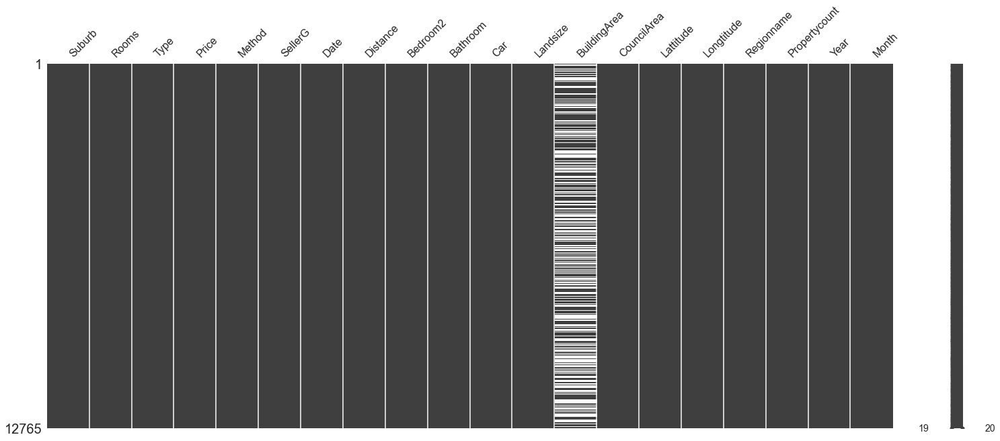

In [8]:
# Check missing values
msno.matrix(df)

## Australian Housing Market Text Analytics

In [20]:
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/jeffrey/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/jeffrey/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

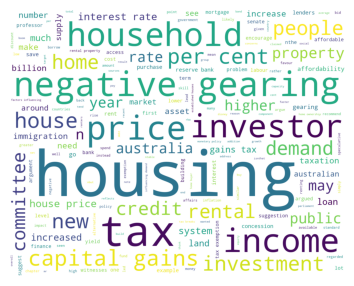

In [21]:
url = "https://www.aph.gov.au/Parliamentary_Business/Committees/Senate/Former_Committees/hsaf/report/c04"
html = urlopen(url).read()
soup = BeautifulSoup(html)
text = soup.get_text()
lines = (line.strip() for line in text.splitlines())
chunks = (phrase.strip() for line in lines for phrase in line.split("  "))
text = 'n'.join(chunk for chunk in chunks if chunk)

stop_words = set(stopwords.words('english'))
words = word_tokenize(text)
wordsFiltered = [word.lower() for word in words if word.isalpha()]
filtered_words = [word for word in wordsFiltered if word not in stopwords.words('english')]

wc = WordCloud(max_words=1000, margin=10, background_color='white',
scale=3, relative_scaling = 0.5, width=500, height=400,
random_state=1).generate(' '.join(filtered_words))
plt.figure(figsize=(10,5))
plt.imshow(wc)
plt.axis("off")
plt.show()

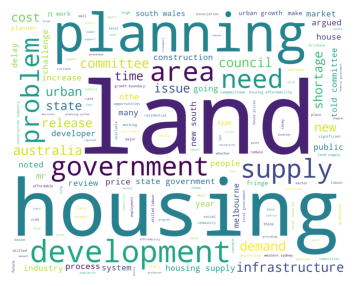

In [22]:
url = "https://www.aph.gov.au/Parliamentary_Business/Committees/Senate/Former_Committees/hsaf/report/c05"
html = urlopen(url).read()
soup = BeautifulSoup(html)
text = soup.get_text()
lines = (line.strip() for line in text.splitlines())
chunks = (phrase.strip() for line in lines for phrase in line.split("  "))
text = 'n'.join(chunk for chunk in chunks if chunk)

stop_words = set(stopwords.words('english'))
words = word_tokenize(text)
wordsFiltered = [word.lower() for word in words if word.isalpha()]
filtered_words = [word for word in wordsFiltered if word not in stopwords.words('english')]

wc = WordCloud(max_words=1000, margin=10, background_color='white',
scale=3, relative_scaling = 0.5, width=500, height=400,
random_state=1).generate(' '.join(filtered_words))
plt.figure(figsize=(10,5))
plt.imshow(wc)
plt.axis("off")
plt.show()

## EDA

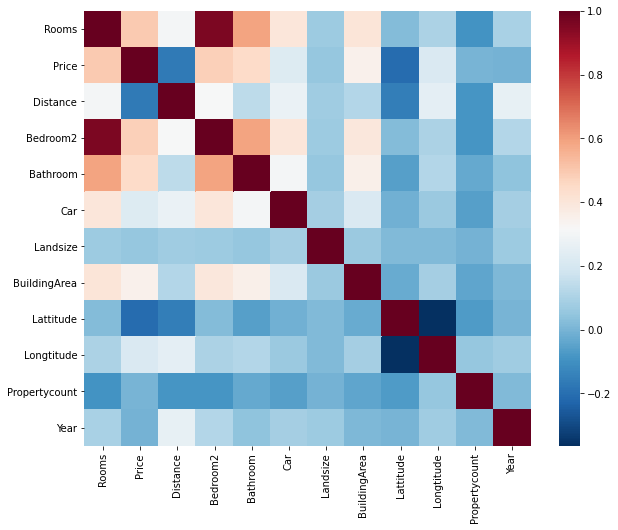

In [15]:
# Correlation Heatmap

plt.figure(figsize=(10,8))
sns.heatmap(df.corr(), cmap='RdBu_r')
plt.show()

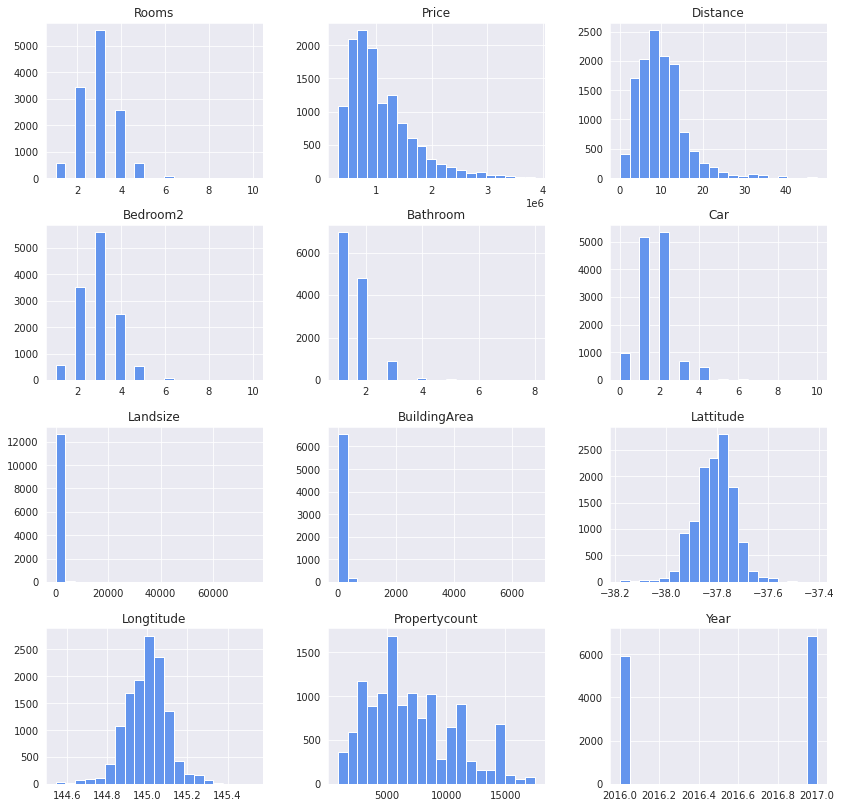

In [16]:
# Histogram of features

df.hist(figsize = (14,14), bins = 20, color="cornflowerblue")
plt.show()

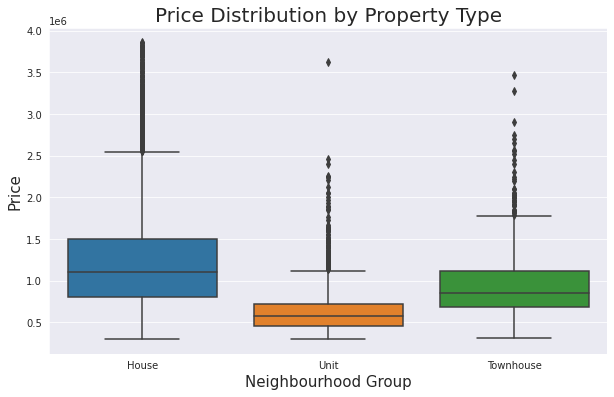

In [17]:
# Violinplots - showcase density and distribtuion of prices 

types = ['House', 'Unit', 'Townhouse']
plt.figure(figsize=(10,6))
ax = sns.boxplot(y="Price",x ='Type' ,data = df)
ax.set_xticklabels(types)
plt.title("Price Distribution by Property Type", fontsize=20)
plt.xlabel('Neighbourhood Group',fontsize=15)
plt.ylabel("Price",fontsize=15);

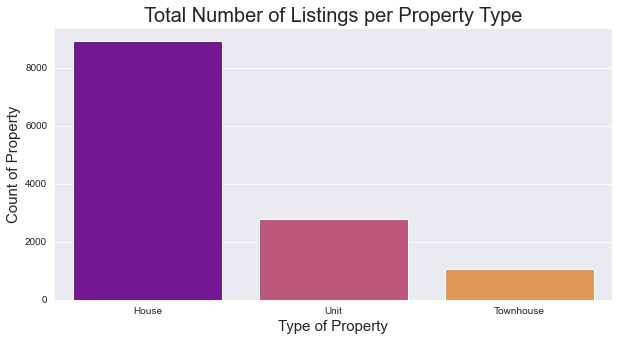

In [ ]:
# Looking at how the quantity of each property type

ax = sns.countplot(x=df['Type'], palette="plasma")
ax.set_xticklabels(types)
fig = plt.gcf()
fig.set_size_inches(10,5)
plt.title('Total Number of Listings per Property Type',fontsize = 20)
plt.xlabel('Type of Property',fontsize = 15)
plt.ylabel('Count of Property',fontsize = 15)
plt.tick_params(labelsize=10)

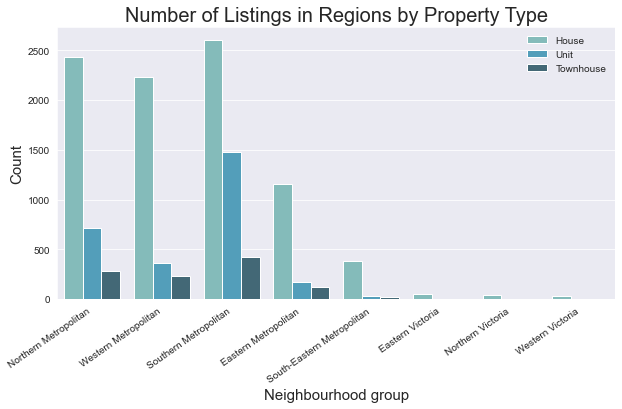

In [ ]:
# Neighbourhoods and their property type count

plt.figure(figsize=(10,5))
sns.countplot(data=df, x='Regionname', hue='Type', palette='GnBu_d')
plt.title('Number of Listings in Regions by Property Type', fontsize=20)
plt.xlabel('Neighbourhood group',fontsize=15)
plt.ylabel("Count",fontsize=15)
plt.legend(frameon=False, fontsize=10,labels=types, loc="upper right")
plt.xticks(rotation=35, ha="right")
plt.tick_params(labelsize=10)

In [32]:
df_2016 = df[df.Year == 2016]
df_2017 = df[df.Year == 2017]
df_2017= df_2017[['Month', 'Price', 'Rooms', 'Propertycount', 'Type']]
df_2016= df_2016[['Month', 'Price', 'Rooms', 'Propertycount', 'Type']]

Text(0.5, 1.0, '2016 Prices')

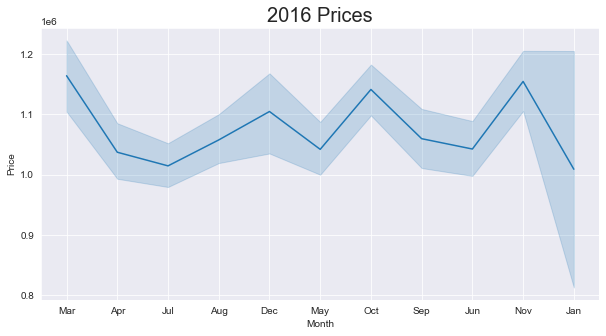

In [34]:
plt.figure(figsize=(10,5))
sns.lineplot(data=df_2016, x="Month", y="Price")
plt.title('2016 Prices', fontsize=20)

Text(0.5, 1.0, '2017 Prices')

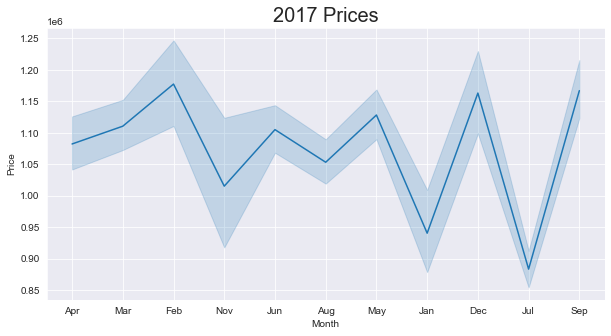

In [36]:
plt.figure(figsize=(10,5))
sns.lineplot(data=df_2017, x="Month", y="Price")
plt.title('2017 Prices', fontsize=20)

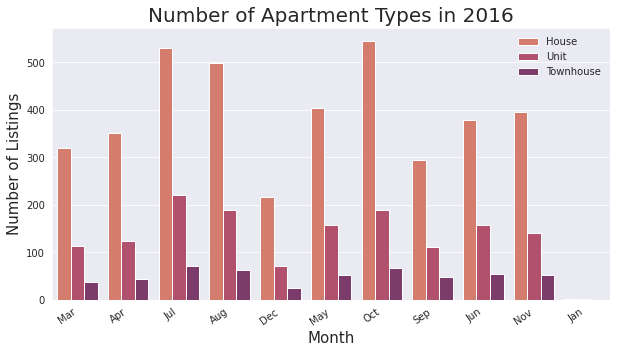

In [207]:
plt.figure(figsize=(10,5))
sns.countplot(data=df_2016, x='Month', hue='Type', palette='flare')
plt.title('Number of Apartment Types in 2016', fontsize=20)
plt.xlabel('Month',fontsize=15)
plt.ylabel("Number of Listings",fontsize=15)
plt.legend(frameon=False, fontsize=10,labels=types, loc="upper right")
plt.xticks(rotation=35, ha="right")
plt.tick_params(labelsize=10)

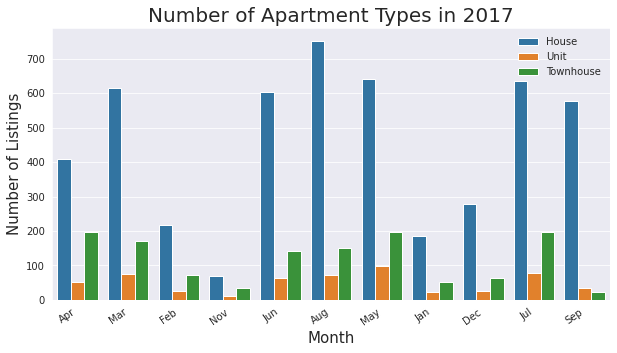

In [208]:
plt.figure(figsize=(10,5))
sns.countplot(data=df_2017, x='Month', hue='Type')
plt.title('Number of Apartment Types in 2017', fontsize=20)
plt.xlabel('Month',fontsize=15)
plt.ylabel("Number of Listings",fontsize=15)
plt.legend(frameon=False, fontsize=10,labels=types, loc="upper right")
plt.xticks(rotation=35, ha="right")
plt.tick_params(labelsize=10)

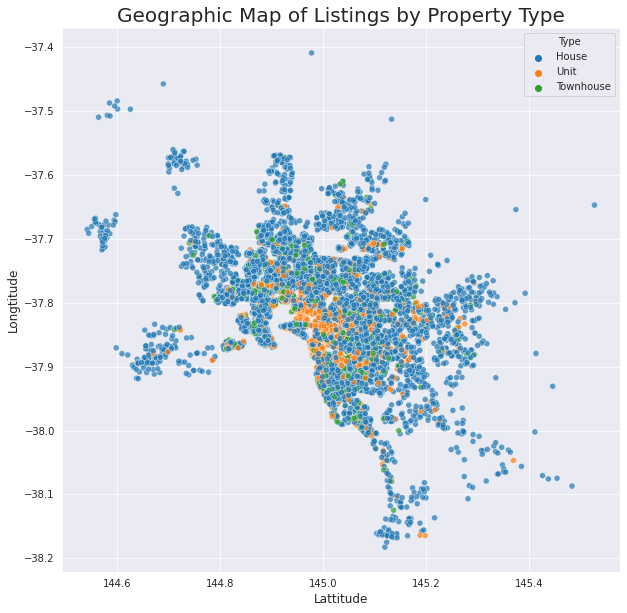

In [266]:
# Plotting the properties by latitude and longitude
data = df.copy()
data['Type'] = data['Type'].map({'h': 'House', 'u': 'Unit', 't':'Townhouse'})
plt.figure(figsize=(10,10))
a = sns.scatterplot(data=data, x='Longtitude', y='Lattitude', hue='Type', alpha=0.7, legend='full')
plt.title('Geographic Map of Listings by Property Type', fontsize=20)
plt.xlabel('Lattitude',fontsize=12)
plt.ylabel("Longtitude",fontsize=12)
plt.tick_params(labelsize=10)

In [9]:
# Display heatmap on map of melbourne.

my_heatmap = folium.Map(location=[37.8136,144.9631], zoom_start=8)

heat_data = [[row['Lattitude'],row['Longtitude']] for index, row in df.iterrows()]

# Plot it on the map
folium.plugins.HeatMap(heat_data, min_opacity = 0.6, blur=30).add_to(my_heatmap)

# Display the map
sw = df[['Lattitude', 'Longtitude']].min().values.tolist()
ne = df[['Lattitude', 'Longtitude']].max().values.tolist()
my_heatmap.fit_bounds([sw, ne]) 
my_heatmap

In [10]:
locations = df[['Lattitude', 'Longtitude']]
locationlist = locations.values.tolist()
len(locationlist)
locationlist

map2 = folium.Map(location=[-37.8136,144.9631], zoom_start=10, tiles='Stamen Terrain')

marker_cluster = folium.plugins.MarkerCluster().add_to(map2)

for point in range(0, len(locationlist)):
    folium.Marker(locationlist[point], popup=df['Regionname'][point]).add_to(marker_cluster)
map2

## Data Processing

In [11]:
df.head(3)

,Suburb,Rooms,Type,Price,Method,SellerG,Date,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Year,Month
0,Abbotsford,2,h,1480000.0,S,Biggin,2016-03-12,2.5,2.0,1.0,1.0,202.0,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0,2016,Mar
1,Abbotsford,2,h,1035000.0,S,Biggin,2016-04-02,2.5,2.0,1.0,0.0,156.0,79.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0,2016,Apr
2,Abbotsford,3,h,1465000.0,SP,Biggin,2017-04-03,2.5,3.0,2.0,0.0,134.0,150.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0,2017,Apr


In [12]:
numeric = df.select_dtypes('number').copy()
del numeric['Year']
del numeric['BuildingArea']
del numeric['Lattitude']
del numeric['Longtitude']

In [13]:
numeric.head(3)

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,Propertycount
0,2,1480000.0,2.5,2.0,1.0,1.0,202.0,4019.0
1,2,1035000.0,2.5,2.0,1.0,0.0,156.0,4019.0
2,3,1465000.0,2.5,3.0,2.0,0.0,134.0,4019.0


In [14]:
## Scaling
scaler = StandardScaler()
scaler.fit(numeric)
scaled = scaler.transform(numeric)
scaled = pd.DataFrame(scaled, columns = numeric.columns)
scaled.head(3)

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,Propertycount
0,-1.012547,0.694557,-1.28709,-0.994082,-0.799825,-0.640299,-0.261620,-0.839421
1,-1.012547,-0.071195,-1.28709,-0.994082,-0.799825,-1.692626,-0.300203,-0.839421
2,0.048110,0.668745,-1.28709,0.071274,0.668150,-1.692626,-0.318656,-0.839421


In [15]:
## PCA

pca = PCA(.95)
pca.fit(scaled)
pcs = pca.transform(scaled)
comps = pca.components_
COLS = ["PC" + str(i) for i in range(1, len(comps)+1)]
loadings = pd.DataFrame(comps.T, columns=COLS, index=numeric.columns)
loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7
Rooms,0.524090,-0.001046,-0.060752,-0.047387,-0.219754,-0.276914,0.300298
Price,0.347376,-0.529210,0.015115,0.181359,0.128089,-0.270020,-0.690306
Distance,0.197940,0.714253,0.024941,-0.290046,-0.227155,-0.013477,-0.560475
Bedroom2,0.522819,0.009593,-0.058758,-0.055416,-0.223534,-0.267661,0.320954
Bathroom,0.422755,-0.169536,-0.009804,-0.018043,-0.121922,0.881110,-0.029626
Car,0.322201,0.240223,0.099578,-0.101410,0.897346,0.018612,0.112699
Landsize,0.073319,0.165358,0.822899,0.525716,-0.108210,0.003097,0.044965
Propertycount,-0.065026,-0.309666,0.552116,-0.768556,-0.043941,-0.043282,0.023548


## Hierarchical Clustering

In [ ]:
# Calculate distances
dist_euclidean = pdist(scaled.values)
dist_manhattan = pdist(scaled.values, metric = "cityblock") 
dist_cosine = pdist(scaled.values, metric = "cosine")

# Linkages
hclust_e = linkage(dist_euclidean)
hclust_c = linkage(dist_cosine)
hclust_m = linkage(dist_manhattan)

# Plot distance metrics
linkages = [hclust_e, hclust_c, hclust_m]
metrics = ['Euclidean', 'Cosine', 'Manhattan']
plt.figure(figsize = (21,5))
for i, m in enumerate(linkages):
    plt.subplot(1,3, i+1)
    plt.title(metrics[i])
    dendrogram(m,
              labels=scaled.index,
              leaf_font_size=10,
              orientation='left')

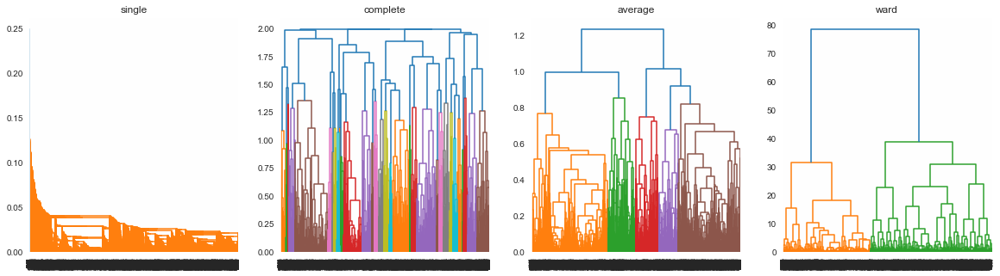

In [ ]:
# Plot linkage methods for cosine
methods = ['single', 'complete', 'average', 'ward']
plt.figure(figsize = (20,5))
for i, m in enumerate(methods):
    plt.subplot(1, 4, i+1)
    plt.title(m)
    dendrogram(linkage(dist_cosine, method=m),
              leaf_rotation=90)

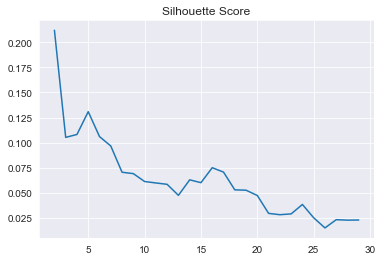

In [ ]:
# Plotting silhouette scores
ks = range(2, 30)

silhouette = []

for k in ks:
    labs = fcluster(linkage(dist_cosine, method="average"), k, criterion='maxclust')
    silhouette.append(silhouette_score(scaled, labs))

plt.title("Silhouette Score")
sns.lineplot(x=ks, y=silhouette)
plt.show()

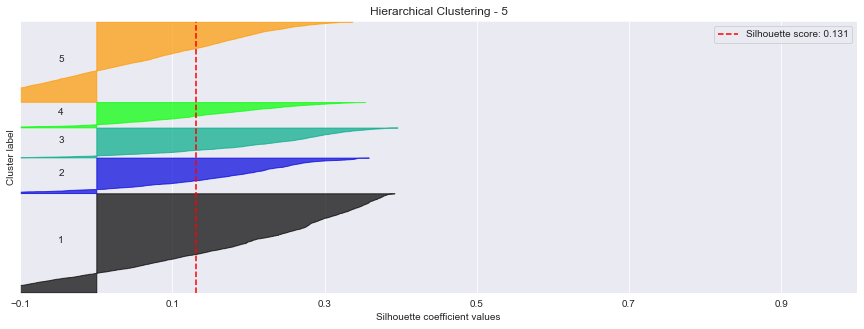

In [ ]:
# Clustering 5 labels
labs = fcluster(linkage(dist_cosine, method="average"), 5, criterion='maxclust')

skplot.metrics.plot_silhouette(scaled, labs, title="Hierarchical Clustering - 5", figsize=(15,5))
plt.show()

## KMeans

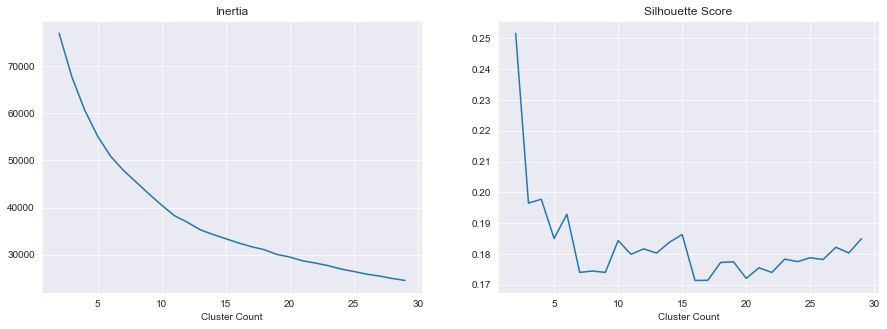

In [13]:
## KMeans

# Plotting inertia and silhouette
ks = range(2, 30)

inertia = []
silhouette = []

for k in ks:
    km = KMeans(k)
    km.fit(scaled)
    labels = km.predict(scaled)
    inertia.append(km.inertia_)
    silhouette.append(silhouette_score(scaled, labels))

plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
plt.title("Inertia")
sns.lineplot(x=ks, y=inertia)
plt.xlabel('Cluster Count')
plt.subplot(1, 2, 2)
plt.title("Silhouette Score")
sns.lineplot(x=ks, y=silhouette)
plt.xlabel('Cluster Count')
plt.show()

In [14]:
output = {}
num_of_clusters = 10
from sklearn import metrics 
for k in range(2, num_of_clusters):
  
  output[k] = {}
  kmeans = KMeans(n_clusters = k, n_init = 100).fit(scaled)
  sil_score = metrics.silhouette_score(scaled, kmeans.labels_, metric = 'euclidean')

  output[k]['silhouette_score'] = sil_score

  print("Number of clusters: {}".format(k))
  print("Silhouette Score: {}".format(sil_score))

Number of clusters: 2
Silhouette Score: 0.25146012799750816
Number of clusters: 3
Silhouette Score: 0.19644681341892126
Number of clusters: 4
Silhouette Score: 0.19790500806073538
Number of clusters: 5
Silhouette Score: 0.18858256315483615
Number of clusters: 6
Silhouette Score: 0.19291561322935538
Number of clusters: 7
Silhouette Score: 0.17426666516105518
Number of clusters: 8
Silhouette Score: 0.18141412387093592
Number of clusters: 9
Silhouette Score: 0.17966861744193693


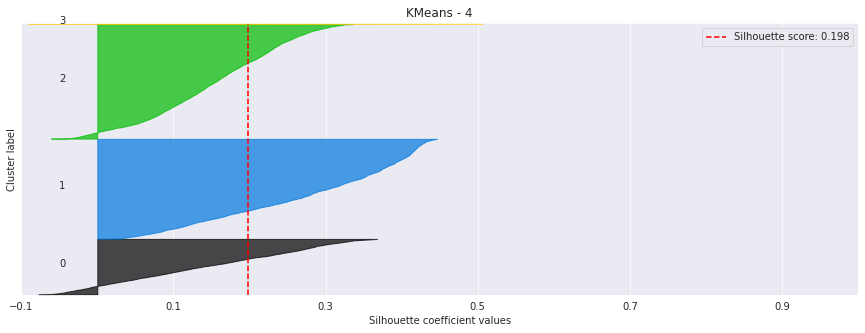

In [121]:
# Clustering for 4 labels
k4 = KMeans(4)
k4_labs = k4.fit_predict(scaled)

# Plotting Individual Cluster Silhouette Scores
skplot.metrics.plot_silhouette(scaled, k4_labs, title="KMeans - 4", figsize=(15,5))
plt.show()

## KMeans + PCA

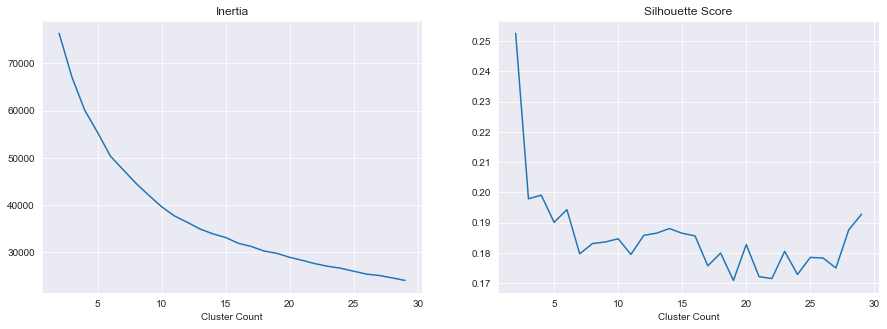

In [15]:
## KMeans

# Plotting inertia and silhouette
ks = range(2, 30)

inertia = []
silhouette = []

for k in ks:
    km = KMeans(k)
    km.fit(pcs)
    labels = km.predict(pcs)
    inertia.append(km.inertia_)
    silhouette.append(silhouette_score(pcs, labels))

plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
plt.title("Inertia")
sns.lineplot(x=ks, y=inertia)
plt.xlabel('Cluster Count')
plt.subplot(1, 2, 2)
plt.title("Silhouette Score")
sns.lineplot(x=ks, y=silhouette)
plt.xlabel('Cluster Count')
plt.show()

In [ ]:
output = {}
num_of_clusters = 10
from sklearn import metrics 
for k in range(2, num_of_clusters):
  
  output[k] = {}
  kmeans = KMeans(n_clusters = k, n_init = 100).fit(pcs)
  sil_score = metrics.silhouette_score(pcs, kmeans.labels_, metric = 'euclidean')

  output[k]['silhouette_score'] = sil_score

  print("Number of clusters: {}".format(k))
  print("Silhouette Score: {}".format(sil_score))

Number of clusters: 2
Silhouette Score: 0.2528628229498057
Number of clusters: 3
Silhouette Score: 0.19786295316880534
Number of clusters: 4
Silhouette Score: 0.1991232754884632
Number of clusters: 5
Silhouette Score: 0.18989949041054904
Number of clusters: 6
Silhouette Score: 0.19427930070326282
Number of clusters: 7
Silhouette Score: 0.17612985160911648
Number of clusters: 8
Silhouette Score: 0.17936113911004936
Number of clusters: 9
Silhouette Score: 0.18139617141754802


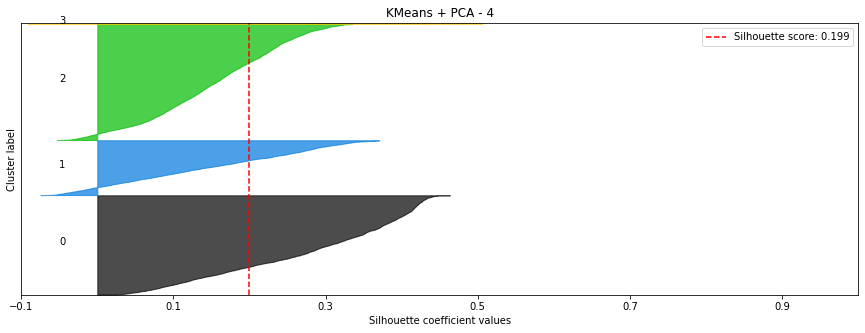

In [17]:
k4_pca = KMeans(4)
k4_pca_labs = k4_pca.fit_predict(pcs)

# Plotting Individual Cluster Silhouette Scores
skplot.metrics.plot_silhouette(pcs, k4_pca_labs, title="KMeans + PCA - 4", figsize=(15,5))
plt.show()

## DBSCAN

(12760.0, 12765.0)

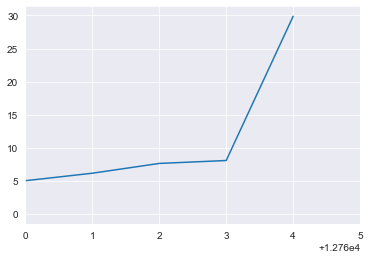

In [18]:
nb = NearestNeighbors(n_neighbors=2)
nbrs = nb.fit(scaled)

distances, indices = nbrs.kneighbors(scaled)

distances = np.sort(distances, axis=0)

distances = distances[:,1]

fig, ax = plt.subplots()
sns.lineplot(x=range(len(distances)), y=distances, ax=ax)
ax.set_xlim(12760, 12765)

In [ ]:
db = DBSCAN(eps=7, min_samples=5)
dbc = db.fit_predict(scaled)
dbc

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
dbscan_df = scaled.copy()
dbscan_df['labels'] = dbc

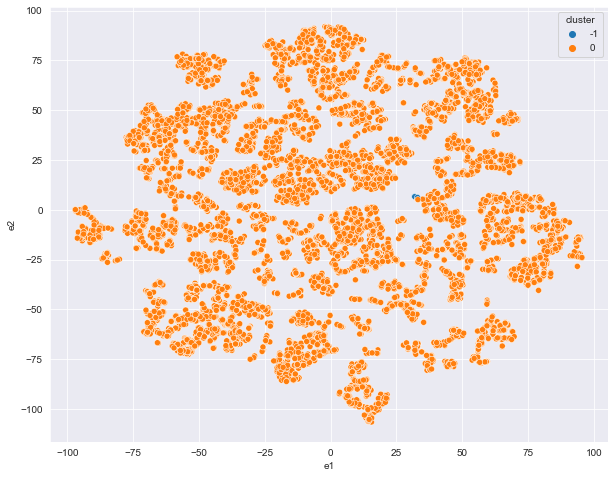

In [ ]:
tsne = TSNE()
tsne.fit(pcs)

te = tsne.embedding_

tdata = pd.DataFrame(te, columns=["e1", "e2"])
tdata['cluster'] = dbscan_df['labels']
tdata.dropna()

PAL = sns.color_palette("bright", 10) 
plt.figure(figsize=(10, 8))
sns.scatterplot(x="e1", y="e2", data=tdata, legend="full", hue="cluster", palette="tab10")
plt.show()

## Cluster Analysis

In [18]:
df['cluster'] = k4_pca_labs
df.head(3)

,Suburb,Rooms,Type,Price,Method,SellerG,Date,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Year,Month,cluster
0,Abbotsford,2,h,1480000.0,S,Biggin,2016-03-12,2.5,2.0,1.0,1.0,202.0,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0,2016,Mar,0
1,Abbotsford,2,h,1035000.0,S,Biggin,2016-04-02,2.5,2.0,1.0,0.0,156.0,79.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0,2016,Apr,0
2,Abbotsford,3,h,1465000.0,SP,Biggin,2017-04-03,2.5,3.0,2.0,0.0,134.0,150.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0,2017,Apr,0


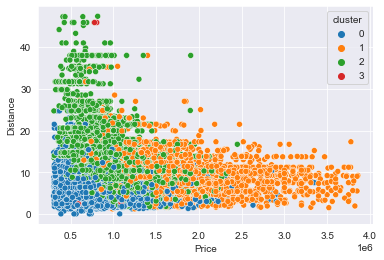

In [37]:
# Distance vs Price
sns.scatterplot(x='Price',y='Distance',hue = 'cluster', data = df, palette="tab10");

''

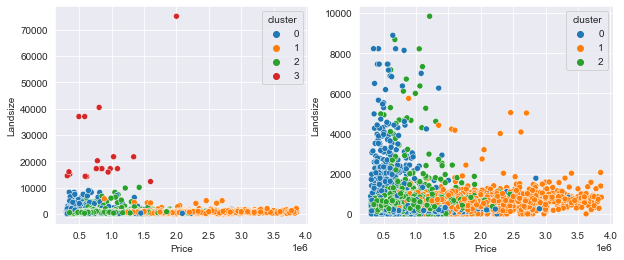

In [38]:
# Landsize vs Price
# Interpretation of the clusters is harder with outliers from landsize. 
# The chart on the right filters for all observations with land size less than or equal to 10000 to get a clearer understanding of cluster properties 

fig, ax = plt.subplots(1,2, figsize=(10, 4))
sns.scatterplot(x='Price',y='Landsize',hue = 'cluster', data = df, palette="tab10", ax=ax[0])
sns.scatterplot(x='Price',y='Landsize',hue = 'cluster',data = df[df.Landsize <= 10000], palette="tab10", ax=ax[1])
;

<AxesSubplot:xlabel='Price', ylabel='Propertycount'>

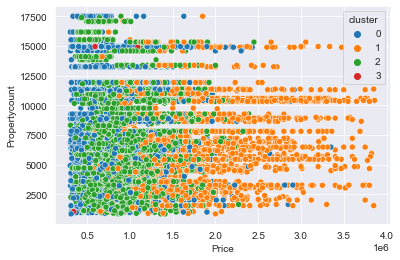

In [39]:
# Property Count vs Price
sns.scatterplot(x='Price',y='Propertycount',hue = 'cluster',data = df, palette="tab10")

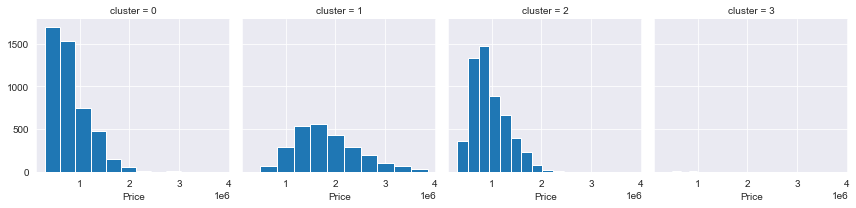

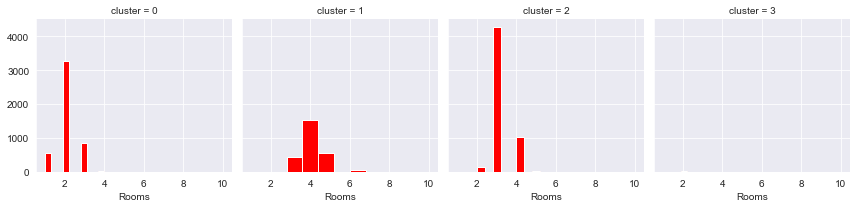

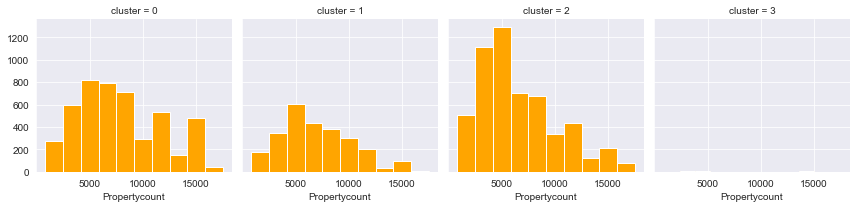

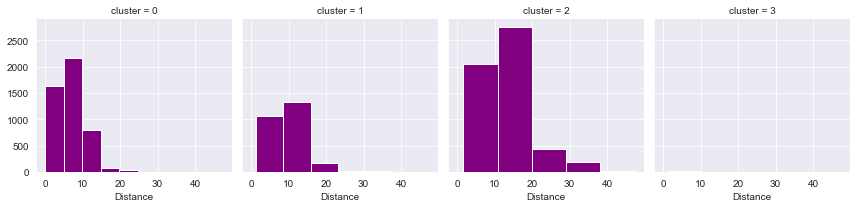

In [40]:
# Histograms
g = sns.FacetGrid(df, col = 'cluster')
g = g.map(plt.hist, 'Price', bins = 10);

g = sns.FacetGrid(df, col = 'cluster')
g = g.map(plt.hist, 'Rooms', bins = 10, color = 'red');

g = sns.FacetGrid(df, col = 'cluster')
g = g.map(plt.hist, 'Propertycount', bins = 10, color = 'orange');

g = sns.FacetGrid(df, col = 'cluster')
g = g.map(plt.hist, 'Distance', bins = 5, color = 'purple');

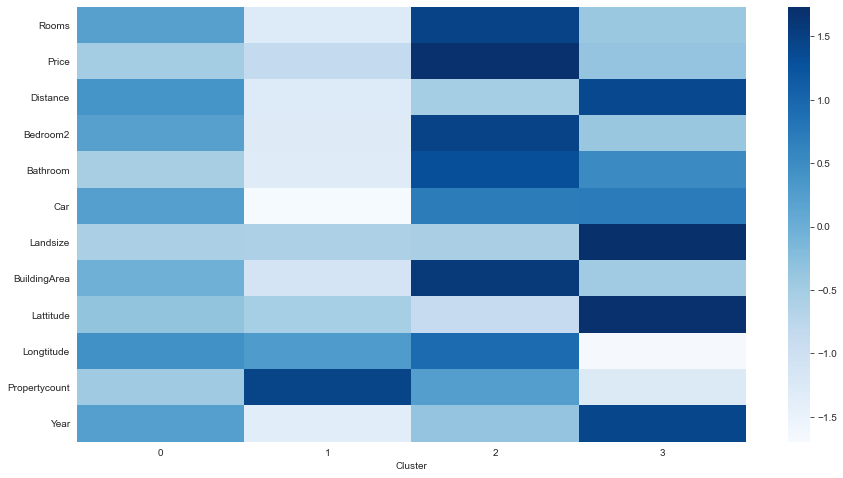

In [ ]:
# Examining Cluster Means created with Kmeans + PCA
x = df.copy()
cluster_profile = x.groupby('cluster').mean()
cluster_profile.T

# Creating heatmap 
clust_scaler = StandardScaler()
cluster_scaled = clust_scaler.fit_transform(cluster_profile)

cluster_scaled = pd.DataFrame(cluster_scaled, 
                              index=cluster_profile.index, 
                              columns=cluster_profile.columns)

plt.figure(figsize=(15,8))
ax = sns.heatmap(cluster_scaled.T, cmap="Blues", center=0)
plt.xlabel('Cluster')
plt.show()

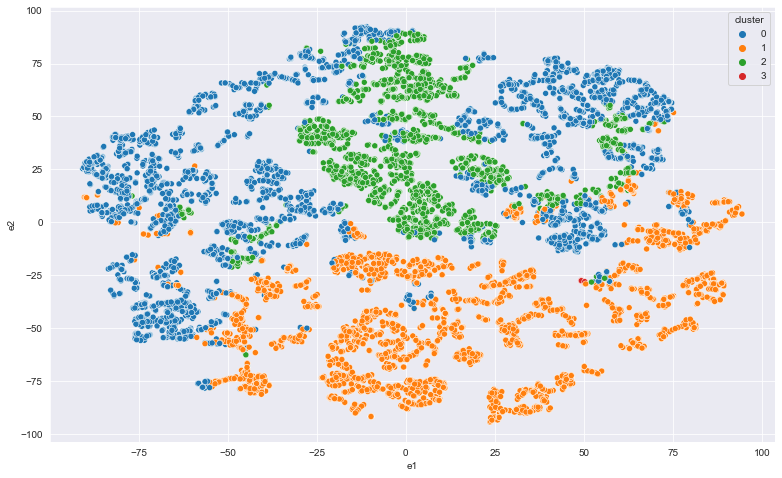

In [ ]:
## TSNE Visualization by Cluster

tsne = TSNE()
tsne.fit(pcs)

te = tsne.embedding_

tdata = pd.DataFrame(te, columns=["e1", "e2"])
tdata['cluster'] = df['cluster']
tdata.dropna()

PAL = sns.color_palette("bright", 10) 
plt.figure(figsize=(13, 8))
sns.scatterplot(x="e1", y="e2", data=tdata, legend="full", hue="cluster", palette="tab10")
plt.show()

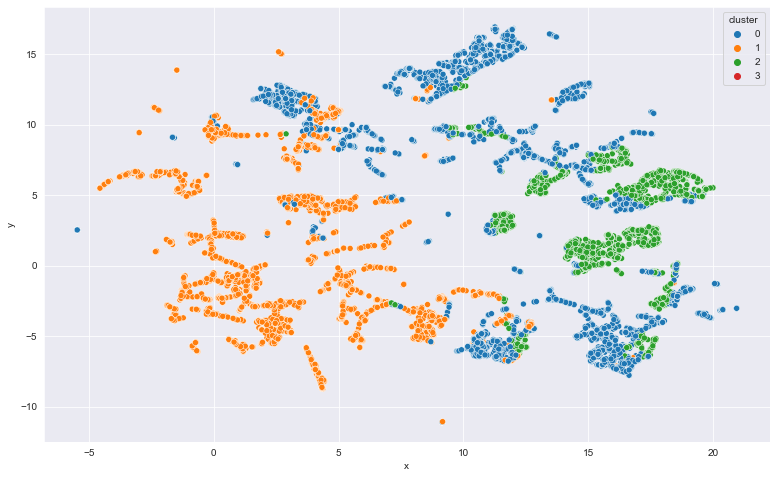

In [ ]:
## UMAP visualization by Cluster

u = UMAP(random_state=820, n_neighbors=10)
u.fit(scaled)
ue = u.transform(scaled)

umap_df = pd.DataFrame(ue, columns=['x', 'y'])
umap_df['cluster'] = df['cluster']
umap_df.dropna()

plt.figure(figsize=(13, 8))
sns.scatterplot(x="x", y="y", data=umap_df, hue="cluster", palette="tab10")
plt.show()

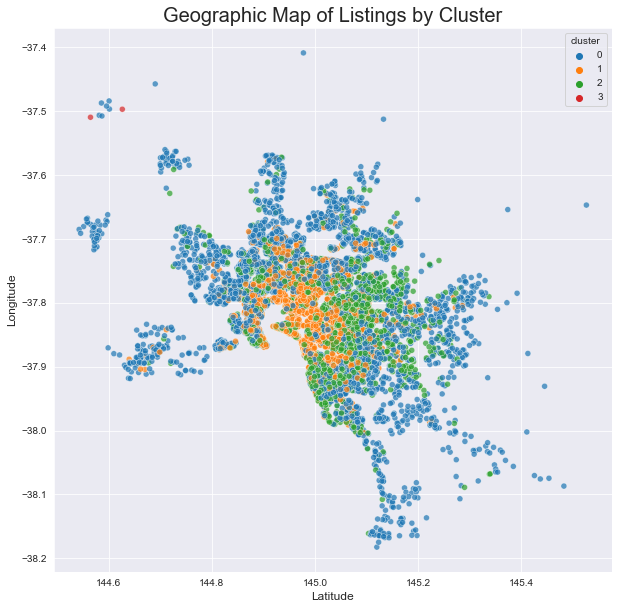

In [ ]:
# Plotting the properties by latitude and longitude
data = df.copy()
plt.figure(figsize=(10,10))
a = sns.scatterplot(data=data, x='Longtitude', y='Lattitude', hue='cluster', alpha=0.7, legend='full', palette="tab10")
plt.title('Geographic Map of Listings by Cluster', fontsize=20)
plt.xlabel('Latitude',fontsize=12)
plt.ylabel("Longitude",fontsize=12)
plt.tick_params(labelsize=10)